# Dataset Preperation

In [1]:
import pandas as pd
import numpy as np

path_1="datasets/UNH.csv"
path_2="datasets/PFE.csv"
path_3="datasets/MRK.csv"

asset_1 = pd.read_csv(path_1)
asset_2 = pd.read_csv(path_2)
asset_3 = pd.read_csv(path_3)

asset_1["Date"] = pd.to_datetime(asset_1["Date"]).dt.strftime("%Y-%m-%d")
asset_2["Date"] = pd.to_datetime(asset_2["Date"]).dt.strftime("%Y-%m-%d")
asset_3["Date"] = pd.to_datetime(asset_3["Date"]).dt.strftime("%Y-%m-%d")

start_date="2023-08-23"
start_date = pd.to_datetime(start_date).strftime("%Y-%m-%d")
# Find the index of the start_date in the asset data
start_index = asset_1.loc[asset_1["Date"] == start_date].index[0]

# Slice the historical data from start_date onwards
historical_prices_1 = asset_1["Close"].iloc[start_index:].values
historical_prices_2 = asset_2["Close"].iloc[start_index:].values
historical_prices_3 = asset_3["Close"].iloc[start_index:].values
historical_prices = np.column_stack([historical_prices_1, historical_prices_2, historical_prices_3])
S0 = historical_prices[0, :]
barrier = S0 * 0.59
print(f"Price at initial fixing date: {S0}")
print(f"Barrier Price: {barrier}")

Price at initial fixing date: [480.22924805  34.61804962 107.69082642]
Barrier Price: [283.33525635  20.42464928  63.53758759]


# Model

## Multi-Asset Black-Scholes Model

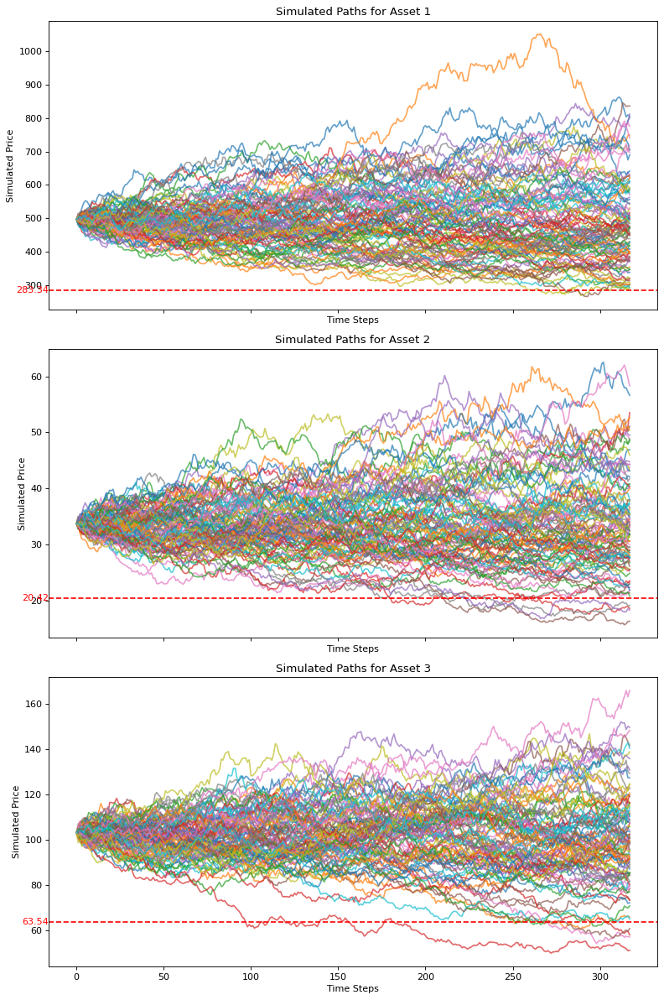

In [2]:
from GBM import MultiBS

multi_bs = MultiBS()

forward_simulation = multi_bs.simulate_multi_GBM_antithetic(m=317, M=10_000)
v, sigma = multi_bs.calibrate_model(forward_simulation)
simul = multi_bs.simulate_multi_GBM_exact(m=317, M=100)
multi_bs.plot(simul)

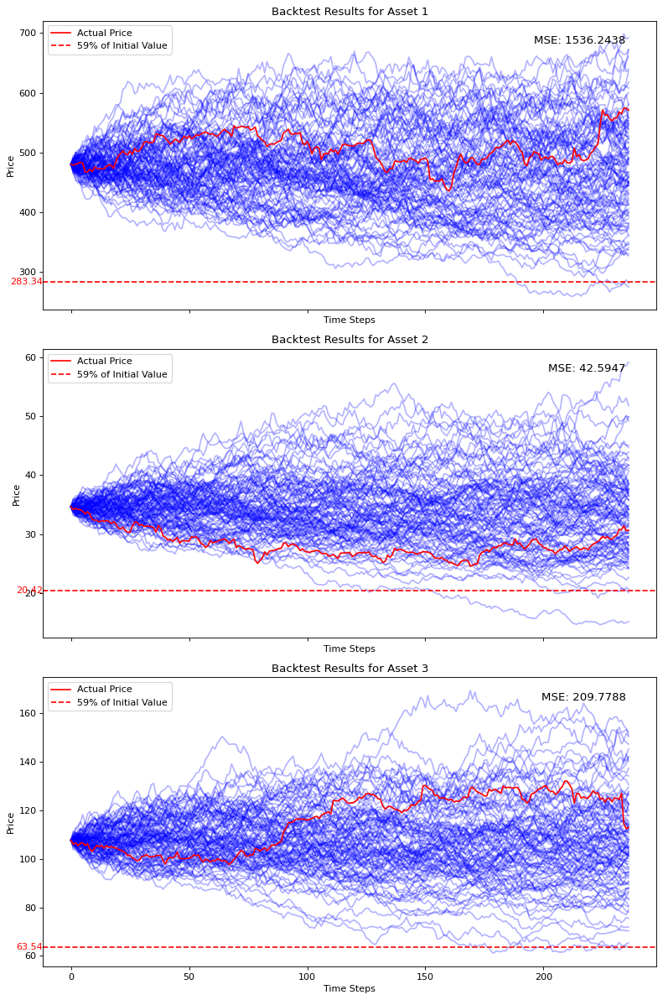

Mean Squared Error (MSE) for each asset: [1536.24382756   42.59472447  209.77884394]
Root Mean Squared Error (RMSE) for each asset: [39.19494645  6.5264634  14.48374413]


array([1536.24382756,   42.59472447,  209.77884394])

In [3]:
multi_bs.backtest(M=100)

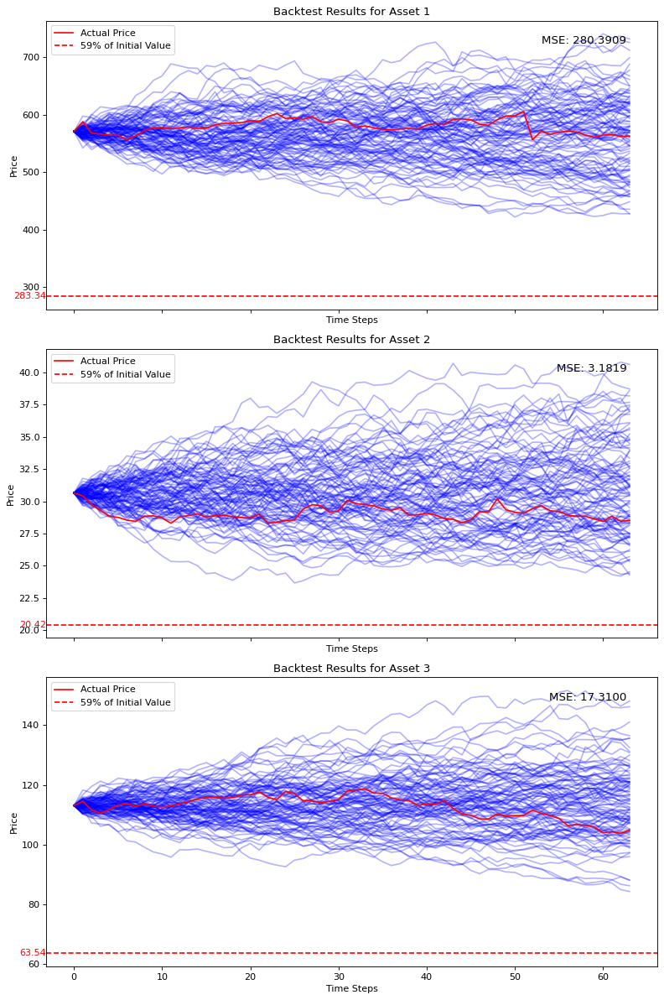

Mean Squared Error (MSE) for each asset: [280.3909379    3.18189604  17.3100398 ]
Root Mean Squared Error (RMSE) for each asset: [16.74487796  1.783787    4.1605336 ]


array([280.3909379 ,   3.18189604,  17.3100398 ])

In [4]:
multi_bs.backtest(M=100, start_date="2024-08-01", end_date="2024-10-30")

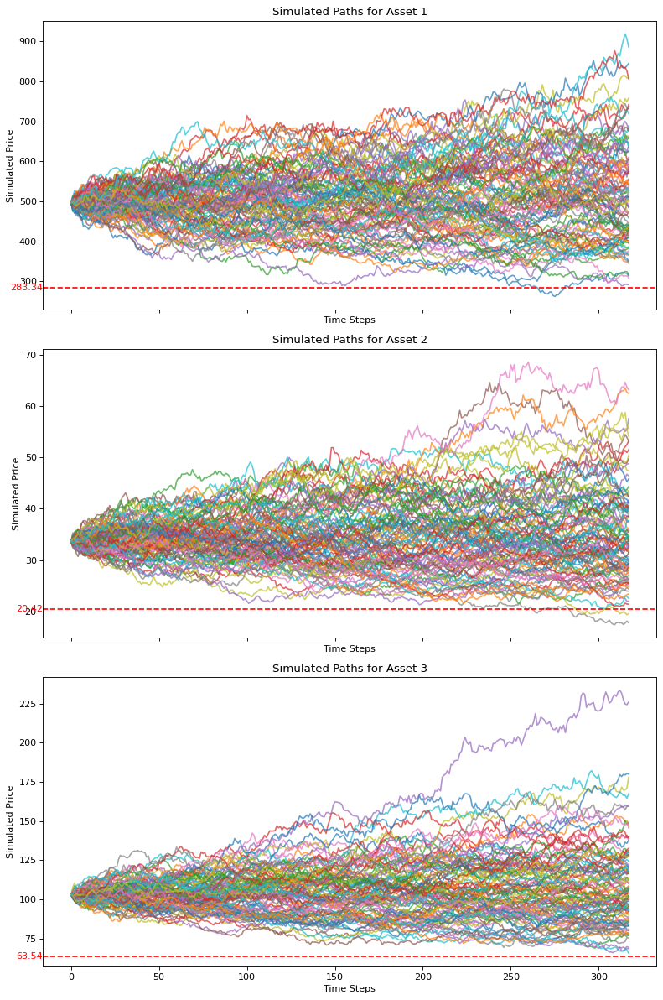

Variance of the final price for asset 1: 16522.856439379564
Variance of the final price for asset 2: 86.93798605668309
Variance of the final price for asset 3: 693.7896870745271


In [5]:
simul = multi_bs.simulate_multi_GBM_exact(m=317, M=100)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")


In [6]:
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

array([[2.19336379e-04, 6.93463586e-05, 5.06271094e-05],
       [6.93463586e-05, 2.34118572e-04, 6.39705365e-05],
       [5.06271094e-05, 6.39705365e-05, 1.58723078e-04]])

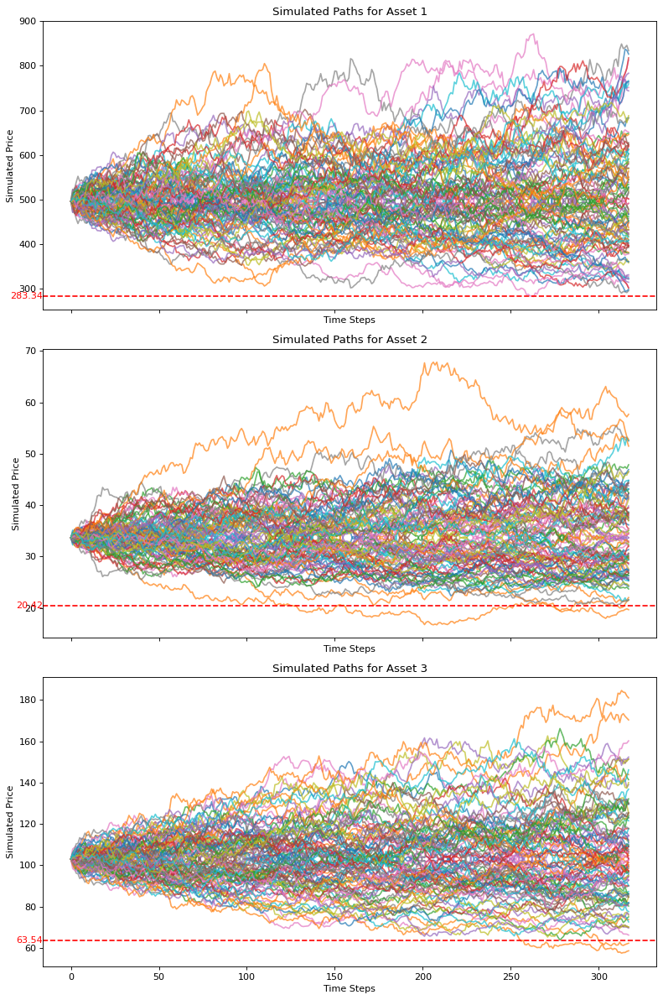

Variance of the final price for asset 1: 1647.5852949972739
Variance of the final price for asset 2: 4.740022931232236
Variance of the final price for asset 3: 50.45868916207172


In [7]:
simul = multi_bs.simulate_multi_GBM_antithetic(m=317, M=100)
multi_bs.plot(simul)
x = simul[:,:,:50] + simul[:,:,50:] 
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(x[:, -1,:][i])}")


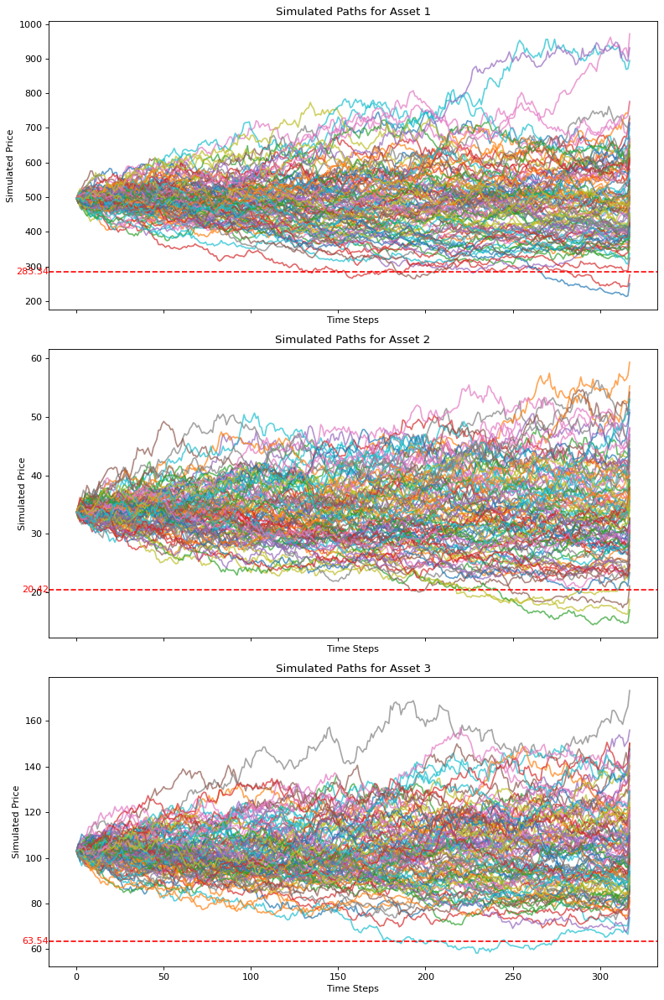

Variance of the final price for asset 1: 17125.981637879144
Variance of the final price for asset 2: 69.47770869489288
Variance of the final price for asset 3: 411.1408700281885


array([[2.36208174e-04, 8.34337841e-05, 6.58250136e-05],
       [8.34337841e-05, 2.50215445e-04, 7.67923193e-05],
       [6.58250136e-05, 7.67923193e-05, 1.73922820e-04]])

In [8]:
simul = multi_bs.simulate_multi_GBM_control_variate(m=317, M=100)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

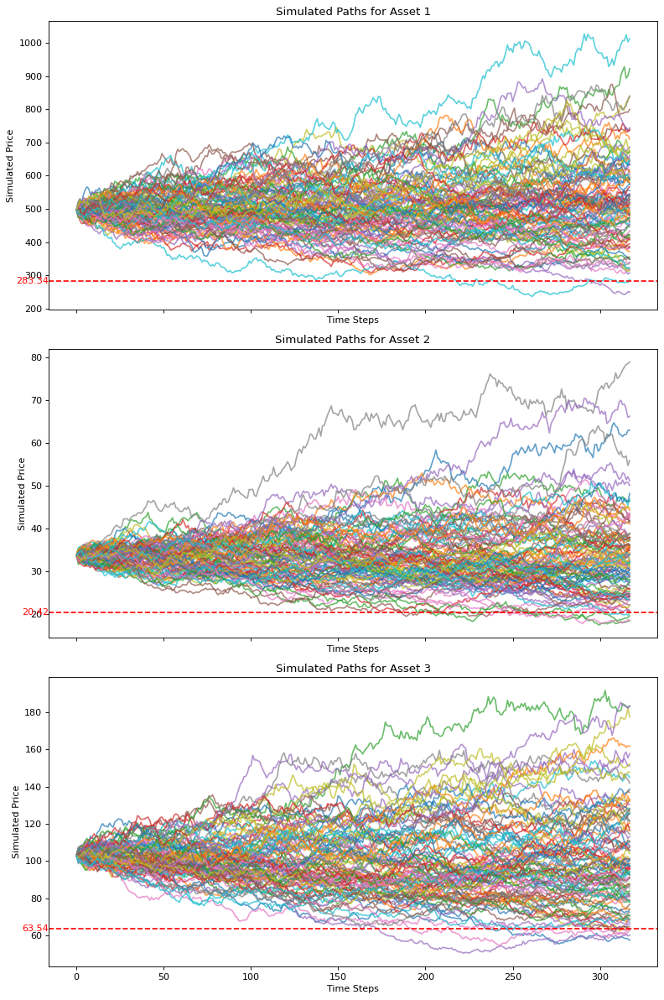

Variance of the final price for asset 1: 19062.139497456094
Variance of the final price for asset 2: 98.02210749246707
Variance of the final price for asset 3: 780.5628886876016


array([[2.22747178e-04, 6.78245082e-05, 5.14610201e-05],
       [6.78245082e-05, 2.31405663e-04, 6.19099646e-05],
       [5.14610201e-05, 6.19099646e-05, 1.58938844e-04]])

In [9]:
simul = multi_bs.simulate_multi_GBM_stratified(m=317, M=100)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

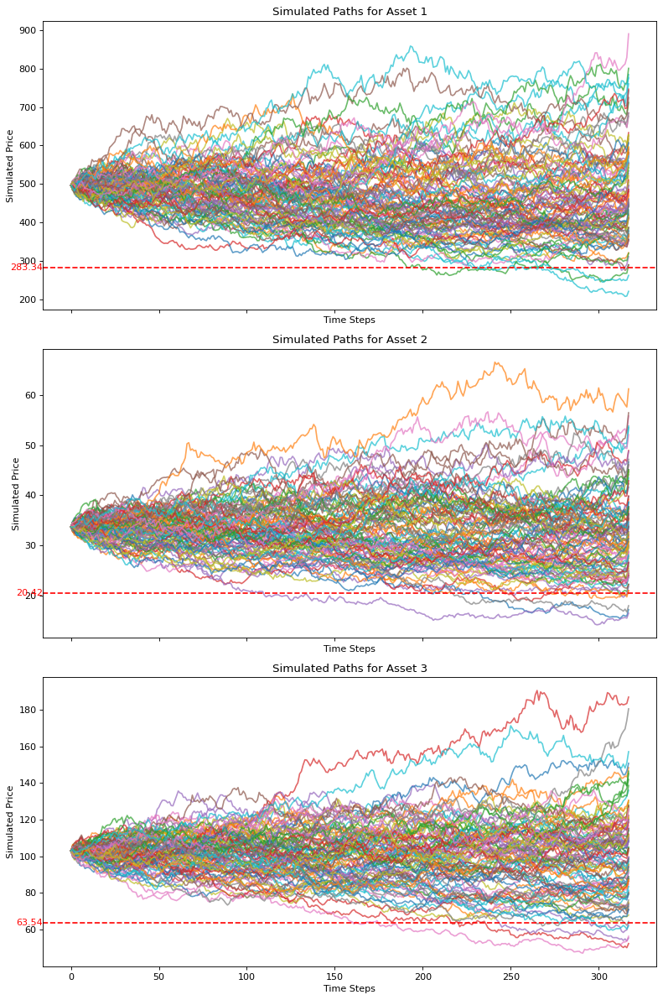

Variance of the final price for asset 1: 17150.158376201998
Variance of the final price for asset 2: 84.11113200882659
Variance of the final price for asset 3: 649.0499984130032


array([[2.32467175e-04, 7.67670262e-05, 5.80124636e-05],
       [7.67670262e-05, 2.44419695e-04, 7.18352119e-05],
       [5.80124636e-05, 7.18352119e-05, 1.66529885e-04]])

In [10]:
simul = multi_bs.simulate_multi_GBM_importance_sampling(m=317, M=100)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")

log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

## Heston Model

In [11]:
import torch
from heston_model import HestonModel


standard_normal = torch.distributions.Normal(torch.tensor([0]), 1)
s0 = torch.tensor([489.44, 36.65, 111])
r = 0.0419
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
standard_normal = torch.distributions.Normal(torch.tensor([0]).to(device), torch.tensor([1]).to(device))
S0 = torch.tensor(S0)
barrier = 0.59 * S0

r = 0.0419
heston = HestonModel()

In [12]:
params, cov = heston.MLE()
sobol = torch.quasirandom.SobolEngine(3 * 2 * 317)
uni = sobol.draw(512).reshape(512,3,-1,2)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)

/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_UNH'] = data[f'yz_var_UNH'].diff()
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:252: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_PFE'] = data[f'yz_var_PFE'].diff()
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:253: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

In [13]:
import matplotlib.pyplot as plt
def plot(simulated_data, show_barrier=True, barrier=barrier):
    if simulated_data is None:
        raise ValueError('No simulated data available. Run the simulation first.')

    p, m, M = simulated_data.shape  # number of assets, time steps, number of paths

    # Create subplots for each asset
    fig, axes = plt.subplots(p, 1, figsize=(10, 5 * p), dpi=80, sharex=True)

    for i in range(p):
        ax = axes[i] if p > 1 else axes  # Select the appropriate axis if p > 1
        # Plot each path for asset i
        ax.plot(simulated_data[i], alpha=0.7)
        if show_barrier:
            ax.axhline(y=barrier[i], color='red', linestyle='--', label='59% of Initial Value')
            ax.annotate(f'{barrier[i]:.2f}', xy=(0, barrier[i]),
                    xytext=(-30, 0), textcoords='offset points',
                    color='red', fontsize=10, va='center', ha='right')
        ax.set_title(f'Simulated Paths for Asset {i+1}')
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Simulated Price')

    plt.tight_layout()
    plt.show()


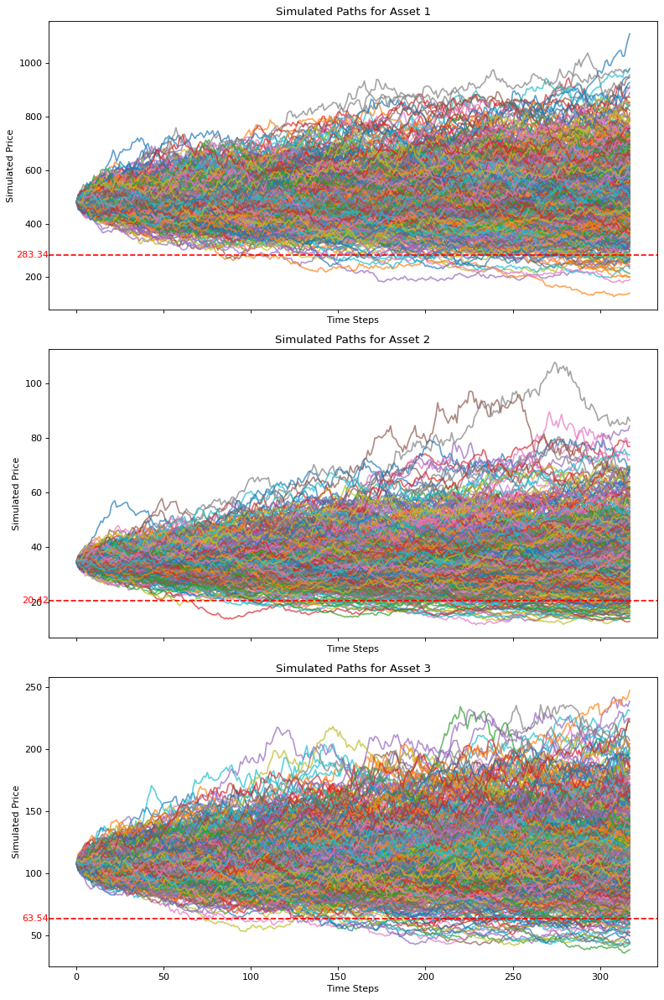

In [14]:
plot(torch.exp(path[1:,:,:,0].permute(1, 2, 0)))

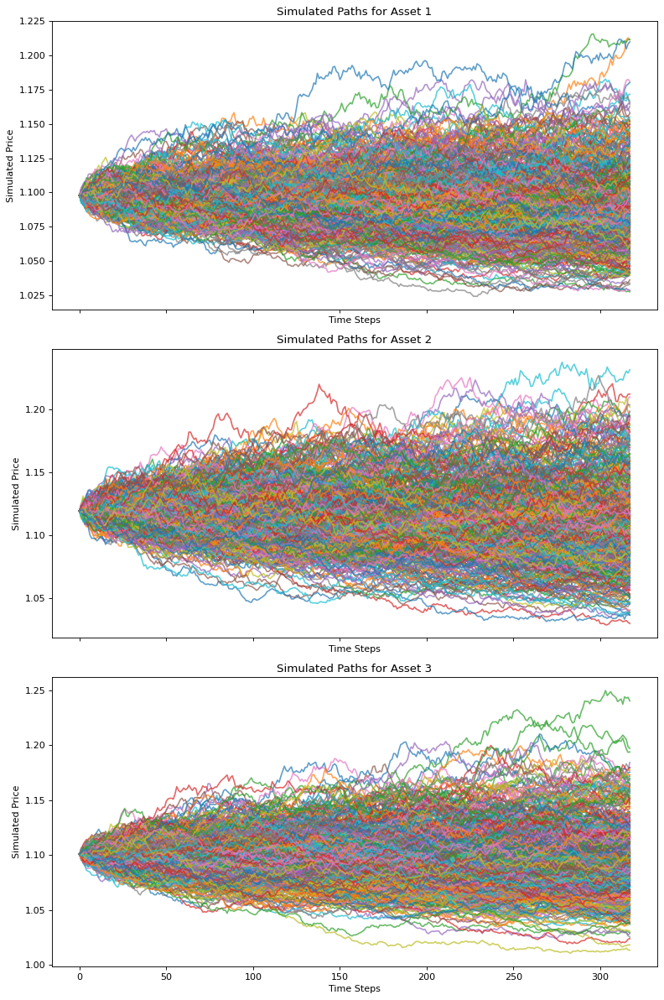

In [15]:
plot(torch.exp(path[1:,:,:,1].permute(1, 2, 0)), show_barrier=False)

## DCC-GARCH Model

# Evaluating Payoff

## Under Black-Scholes Model

Training the callable payoff function

In [26]:
from payoff import CallablePayoff
from tqdm import tqdm

S0 = historical_prices[0,:]
bs_payoff = CallablePayoff(0, r=0.0419, S0=S0)

epochs = 500
with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=1_000,S0=S0) # 317 business days from initial fixing to final fixing
        path = np.log(path) # in asset, timestep, path
        # (path #, asset #, timestep #)
        path = path.transpose(2, 0, 1)
        losses = bs_payoff.minimise_over_path(path)
        pbar.set_postfix({'Worst loss': max(losses), 
                            'Best Loss': min(losses)})
        pbar.update(1)


Training Progress: 100%|██████████| 500/500 [00:52<00:00,  9.46it/s, Worst loss=5.53e+3, Best Loss=5.48e+3]


In [27]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=100_000,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
print(f"Expected Payoff: {x.mean()}")

Expected Payoff: 1019.5646509803995


In [28]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=100_000,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
x = bs_payoff.evaluate_payoff(path, False)
print(f"Expected Payoff: {x.mean()}")

Expected Payoff: 1029.776328592033


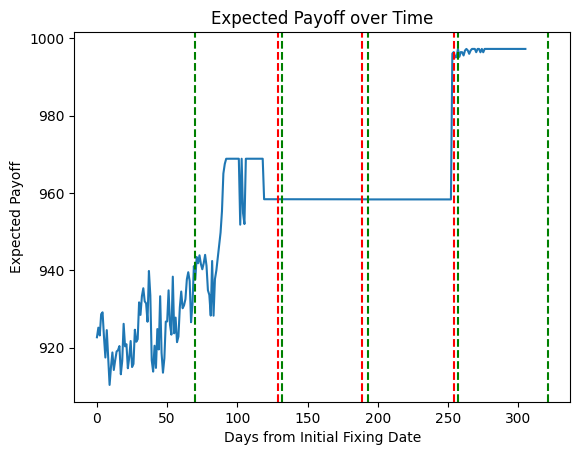

In [ ]:
import matplotlib.pyplot as plt

M = 100_000
payout = []
bs_payoff.current_date = 0
t = 0
calling_dates = [129, 189, 254]
payoff_dates = [70, 132, 193, 257, 321]

for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(2,1,0)
    bs_payoff.current_date += 1
    path = multi_bs.simulate_multi_GBM_antithetic(m=j, M=M, S0=s0)
    path = np.concatenate([historical_data, path], axis=1)
    path = np.log(path) 
    path = path.transpose(2, 0, 1)
    expected_payoff = bs_payoff.evaluate_payoff(path, True).mean()
    payout.append(expected_payoff.item())

plt.plot(payout)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")

for calling_date in calling_dates:
    plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
for payoff_date in payoff_dates:
    plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')
    
    
plt.title("Expected Payoff over Time")
plt.show()

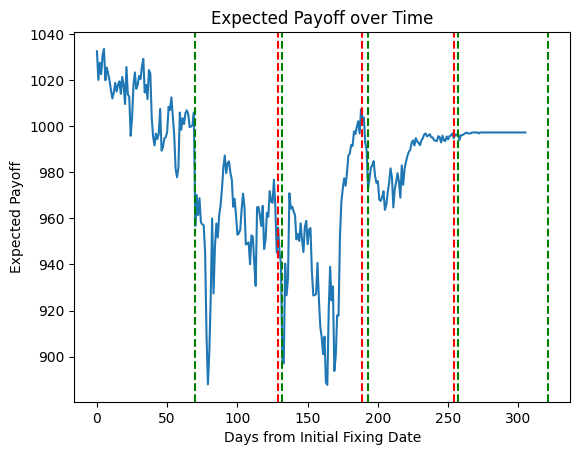

In [20]:
payout = []
bs_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(2,1,0)
    bs_payoff.current_date += 1
    path = multi_bs.simulate_multi_GBM_antithetic(m=j, M=M, S0=s0)
    path = np.concatenate([historical_data, path], axis=1)
    path = np.log(path) 
    path = path.transpose(2, 0, 1)
    expected_payoff = bs_payoff.evaluate_payoff(path, False).mean()
    payout.append(expected_payoff.item())

plt.plot(payout)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")

for calling_date in calling_dates:
    plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
for payoff_date in payoff_dates:
    plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')
    
plt.title("Expected Payoff over Time")
plt.show()

## Under Heston Model

In [ ]:
from payoff import CallablePayoff
from tqdm import tqdm

heston_payoff = CallablePayoff(0, 0.0419, s0)
sobol = torch.quasirandom.SobolEngine(3 * 2 * 317)

params, cov = heston.MLE()
S0 = torch.tensor(S0)
M = 10_000
epochs = 2000

with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        
        uni = sobol.draw(512).reshape(512,3,-1,2)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)

        path = heston.multi_asset_path(u, uni, params, r, cov, S0)
        losses = heston_payoff.minimise_over_path(path[:,:,:,0])
        
        pbar.set_postfix({'Worst loss': max(losses), 
                          'Best Loss': min(losses)})
        pbar.update(1)

/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_UNH'] = data[f'yz_var_UNH'].diff()
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:252: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_PFE'] = data[f'yz_var_PFE'].diff()
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:253: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

In [22]:
uni = sobol.draw(10_000).reshape(10_000,3,-1,2)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
print(f"Expected Payoff: {returns.mean()}")

Expected Payoff: 796.906337576887


/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path)


In [23]:
uni = sobol.draw(10_000).reshape(10_000,3,-1,2)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
print(f"Expected Payoff: {returns.mean()}")

Expected Payoff: 920.396765779227


In [24]:
payout = []
heston_payoff.current_date = 0
t = 0
S0 = torch.tensor(historical_prices)
M = 100_000

for j in range(317, 317 - len(historical_prices), -1):
    s0 = S0[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(0, 2, 1)
    heston_payoff.current_date += 1
    sobol = torch.quasirandom.SobolEngine(3 * 2 * j)
    uni = sobol.draw(M).reshape(M, 3, -1, 2)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    path = heston.multi_asset_path(u, uni, params, r, cov, s0)
    path = torch.cat([torch.tensor(historical_data), path[:,:,:,0]], dim=2)
    expected_payoff = heston_payoff.evaluate_payoff(path, True).mean()
    payout.append(expected_payoff.item())

plt.plot(payout)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")

for calling_date in calling_dates:
    plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
for payoff_date in payoff_dates:
    plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')

plt.title("Expected Payoff over Time")
plt.show()

KeyboardInterrupt: 

/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path)


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

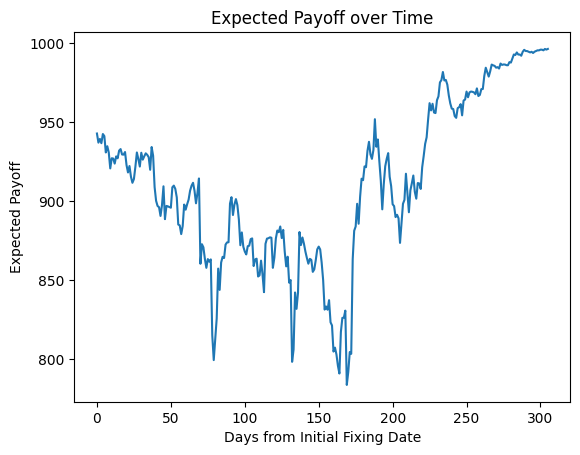

In [ ]:
payout = []
heston_payoff.current_date = 0
t = 0
S0 = torch.tensor(historical_prices)
for j in range(317, 317 - len(historical_prices), -1):
    s0 = S0[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(0, 2, 1)
    heston_payoff.current_date += 1
    sobol = torch.quasirandom.SobolEngine(3 * 2 * j)
    uni = sobol.draw(M).reshape(M, 3, -1, 2)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    path = heston.multi_asset_path(u, uni, params, r, cov, s0)
    path = torch.cat([torch.tensor(historical_data), path[:,:,:,0]], dim=2)
    expected_payoff = heston_payoff.evaluate_payoff(path, False).mean()
    payout.append(expected_payoff.item())

plt.plot(payout)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")

for calling_date in calling_dates:
    plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
for payoff_date in payoff_dates:
    plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')

plt.title("Expected Payoff over Time")
plt.show()

## Under DCC-GARCH Model

# Portfolio Optimization

## Under Black-Scholes Model

In [ ]:
delta = multi_bs.calculate_delta(pay_off=bs_payoff, m=317, h=0.01, S0=S0)
gamma = multi_bs.calculate_gamma(pay_off=bs_payoff, m=317, h=0.01, S0=S0)
print(f"Delta: {delta}, \nGamma: \n{gamma}")

Delta: [0.25603795 0.44662118 0.85039899], 
Gamma: 
[[ -0.04249866  -0.17569541   0.06839506]
 [  0.36433131 -16.58359042  -2.10482927]
 [ -0.22898361  -3.8539014   -1.33405202]]


## Under Heston Model

In [ ]:
delta = torch.empty(3)
for i in range(3):
        
    uni = sobol.draw(M).reshape(M,3,-1,2)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
    up_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
        
    uni = sobol.draw(M).reshape(M,3,-1,2)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
    down_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
    
    delta[i] = (up_payoff - down_payoff) / 0.02 / s0[i]
print('Payoff delta:', delta.tolist())

# Find gamma
gamma = torch.empty((3,3))
for i in range(3):
    for j in range(3):
        
        uni = sobol.draw(M).reshape(M,3,-1,2)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 1.01
        s0_temp[j] *= 1.01
        
        up1_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        up1_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
            
        uni = sobol.draw(M).reshape(M,3,-1,2)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 1.01
        s0_temp[j] *= 0.99
        
        down1_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        down1_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
            
        uni = sobol.draw(M).reshape(M,3,-1,2)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 0.99
        s0_temp[j] *= 1.01
        
        down2_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        down2_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
        
        uni = sobol.draw(M).reshape(M,3,-1,2)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 0.99
        s0_temp[j] *= 0.99
        
        up2_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        up2_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
        
        gamma[i,j] = (up1_payoff - down1_payoff - down2_payoff + up2_payoff) / (4 * 0.01**2 * s0[i] * s0[j])
print('Payoff gamma:', gamma.tolist())

put_delta = torch.empty(3)
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = torch.clamp(s0_temp[i]-up_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = torch.clamp(s0_temp[i]-down_paths[:,-1], 0).nanmean()
    
    put_delta[i] = (up_put - down_put) / 0.02 / s0[i]
print('Put delta:', put_delta.tolist())

put_gamma = torch.empty((3,3))
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = torch.clamp(s0_temp[i]-up_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    
    mid_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    mid_put = torch.clamp(s0_temp[i]-mid_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = torch.clamp(s0_temp[i]-down_paths[:,-1], 0).nanmean()
    
    put_delta[i] = (up_put - 2 * mid_put + down_put) / (0.04 * s0[i]**2)
print('Put gamma:', put_delta.tolist())

stock_delta = torch.empty(3)
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = up_paths[:,-1].nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = down_paths[:,-1].nanmean()
    
    stock_delta[i] = (up_put - down_put) / 0.02 / s0[i]
print('Stock delta:', stock_delta.tolist())

/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.S0 = torch.log(torch.tensor(S0)) # In order of UNH, PFE, MRK
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_UNH'] = data[f'yz_var_UNH'].diff()
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:252: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

Payoff delta: [-0.19571331000562792, 5.939888931071428, -0.12404493023116504]
Payoff gamma: [[-0.005763936186629407, -0.07542723203762075, -0.025400078285912685], [-0.07547250422078693, -0.9878355018486242, -0.3325200125835535], [-0.02542040749561845, -0.33271959443893157, -0.11206554969571357]]
Put delta: [0.504023455282747, 0.49029054530578914, 0.5005764496136589]
Put gamma: [-0.0005161926741609752, -0.006591547974817188, -0.002259275522799393]
Stock delta: [0.0010494680199389977, 0.013762737511817525, 0.004470492660217606]


# Risk Analysis

## Under Black-Scholes Model

In [ ]:
from helper import calculate_var_cvar
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

NameError: name 'bs_payoff' is not defined

In [ ]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, False)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

NameError: name 'bs_payoff' is not defined

## Under Heston Model

In [ ]:
uni = sobol.draw(M).reshape(M,3,-1,2)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 997.2439271253164, Conditional Value at Risk: 997.2439271253165


In [ ]:
uni = sobol.draw(M).reshape(M,3,-1,2)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 997.2439271253164, Conditional Value at Risk: 997.2439271253165


## Under DCC-GARCH Model